In [1]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import yfinance as yf
import hvplot.pandas
from pathlib import Path
import requests
import json
import csv
import io
from finta import TA
import matplotlib.pyplot as plt

In [2]:
alpha_vantage_key = 'N35DJ1POAUO7MXX6'
trading_days_year = 252
total_days_year = 365
thirty_years_ago = (pd.Timestamp.today() - pd.Timedelta(days = total_days_year * 30)).date()
ten_years_ago = (pd.Timestamp.today() - pd.Timedelta(days = total_days_year * 10)).date()
five_years_ago = (pd.Timestamp.today() - pd.Timedelta(days = total_days_year * 5)).date()
three_years_ago = (pd.Timestamp.today() - pd.Timedelta(days = total_days_year * 3)).date()
one_year = (pd.Timestamp.today() - pd.Timedelta(days = total_days_year * 1)).date()
six_months = (pd.Timestamp.today() - pd.Timedelta(days = total_days_year / 2)).date()
yesterday = (pd.Timestamp.today() - pd.Timedelta(days = 1)).date()

url = f'https://www.alphavantage.co/query?function=LISTING_STATUS&apikey={alpha_vantage_key}'
response = requests.get(url)
data = response.text

In [3]:
listed_stocks = pd.read_csv(io.StringIO(data))
listed_stocks = listed_stocks[listed_stocks['exchange'] == 'NASDAQ']
listed_stocks = listed_stocks[listed_stocks['symbol'].str.len() <= 4]
listed_stocks

,symbol,name,exchange,assetType,ipoDate,delistingDate,status
7,AACG,ATA Creativity Global,NASDAQ,Stock,2008-01-29,NaN,Active
8,AACI,Armada Acquisition Corp I,NASDAQ,Stock,2021-11-10,NaN,Active
14,AADI,Aadi Bioscience Inc,NASDAQ,Stock,2017-08-08,NaN,Active
15,AADR,AdvisorShares Dorsey Wright ADR ETF,NASDAQ,ETF,2010-07-21,NaN,Active
20,AAL,American Airlines Group Inc,NASDAQ,Stock,2005-09-27,NaN,Active
...,...,...,...,...,...,...,...
11515,ZVSA,ZyVersa Therapeutics Inc,NASDAQ,Stock,2022-12-12,NaN,Active
11522,ZYME,Zymeworks BC Inc,NASDAQ,Stock,2017-04-28,NaN,Active
11523,ZYNE,Zynerba Pharmaceuticals Inc,NASDAQ,Stock,2015-08-05,NaN,Active
11524,ZYRX,Global Earnings Capital Ltd,NASDAQ,Stock,2007-07-13,NaN,Active


In [4]:
symbols = listed_stocks['symbol']
symbols_str = symbols.to_list()
yf_df = yf.Tickers(symbols_str)
yf_df =yf_df.history(start = one_year, end = yesterday)
yf_df = yf_df[['Open', 'Close', 'High', 'Low', 'Volume']]

[*********************100%***********************]  4137 of 4137 completed

ERROR 
37 Failed downloads:
ERROR ['NDAC']: Exception('NDAC: No timezone found, symbol may be delisted')
ERROR ['FWP']: Exception('FWP: No timezone found, symbol may be delisted')
ERROR ['ZYRX']: Exception('ZYRX: No timezone found, symbol may be delisted')
ERROR ['AGTC']: Exception('AGTC: No timezone found, symbol may be delisted')
ERROR ['GET']: Exception('GET: No timezone found, symbol may be delisted')
ERROR ['QTNT']: Exception('QTNT: No timezone found, symbol may be delisted')
ERROR ['TBSA']: Exception('TBSA: No timezone found, symbol may be delisted')
ERROR ['NXMD']: Exception('NXMD: No timezone found, symbol may be delisted')
ERROR ['ISO']: Exception('ISO: No data found, symbol may be delisted')
ERROR ['HMCO']: Exception('HMCO: No timezone found, symbol may be delisted')
ERROR ['FTPA']: Exception('FTPA: No data found, symbol may be delisted')
ERROR ['FTAA']: Exception('FTAA: No timezone found, symbol may be delisted')
ERROR ['DGNU']: Exception('DGNU: No data found, symbol may be 

In [5]:
def get_stock(stock, yf_df = yf_df):
    open_prices = yf_df['Open']
    close_prices = yf_df['Close']
    high_prices = yf_df['High']
    low_prices = yf_df['Low']
    volume = yf_df['Volume']
    stock = pd.concat([open_prices[stock],
                     close_prices[stock],
                     high_prices[stock],
                     low_prices[stock],
                    volume[stock]], axis = 1)
    stock.columns = ['open', 'close', 'high', 'low', 'volume']
    return stock
def plot_candles(prices, title):
    prices = prices.tail(90)
    #create figure
    plt.figure(facecolor= 'darkgrey', figsize= (15,5))
    plt.axes().set_facecolor('darkgrey')
    #define width of candlestick elements
    width = .8
    width2 = .1

    #define up and down prices
    up = prices[prices.close>=prices.open]
    down = prices[prices.close<prices.open]

    #define colors to use
    col1 = 'white'
    col2 = 'black'

    #plot up prices
    plt.bar(up.index,up.close-up.open,width,bottom=up.open,color=col1)
    plt.bar(up.index,up.high-up.close,width2,bottom=up.close,color=col1)
    plt.bar(up.index,up.low-up.open,width2,bottom=up.open,color=col1)

    #plot down prices
    plt.bar(down.index,down.close-down.open,width,bottom=down.open,color=col2)
    plt.bar(down.index,down.high-down.open,width2,bottom=down.open,color=col2)
    plt.bar(down.index,down.low-down.close,width2,bottom=down.close,color=col2)
    plt.title(title)
    #rotate x-axis tick labels
    plt.xticks(rotation=45, ha='right')


    #display candlestick chart
    plt.show()

In [6]:
returns = yf_df['Close'].pct_change()
stock_count = returns.shape[1]
top_percent = round(stock_count*0.05)
yr = returns.shape[0]
half = round(yr/2)
quart = round(yr*0.75)
mo = yr-30

returns_1yr = (returns+1).cumprod()
returns_6mo = (returns.iloc[half:]+1).cumprod()
returns_quart = (returns.iloc[quart:]+1).cumprod()
returns_1mo = (returns.iloc[mo:]+1).cumprod()

top_1yr = returns_1yr.iloc[-1].dropna().sort_values(ascending = False).head(top_percent)
top_6mo = returns_6mo.iloc[-1].dropna().sort_values(ascending = False).head(top_percent)
top_quart = returns_quart.iloc[-1].dropna().sort_values(ascending = False).head(top_percent)
top_1mo = returns_1mo.iloc[-1].dropna().sort_values(ascending = False).head(top_percent)

top_1yr_list = top_1yr.index.to_list()
top_6mo_list = top_6mo.index.to_list()
top_quart_list = top_quart.index.to_list()
top_1mo_list = top_1mo.index.to_list()

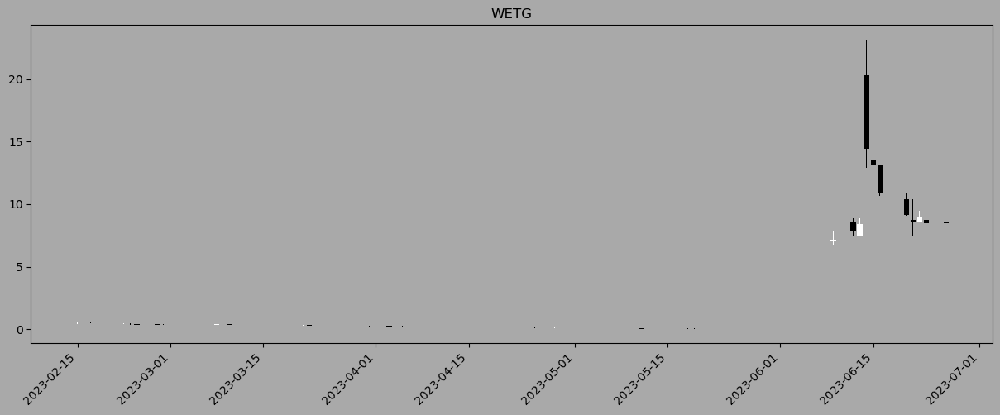

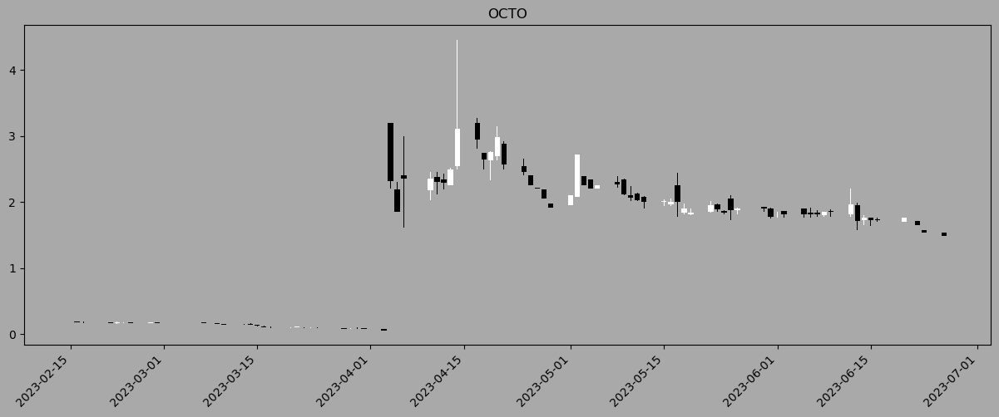

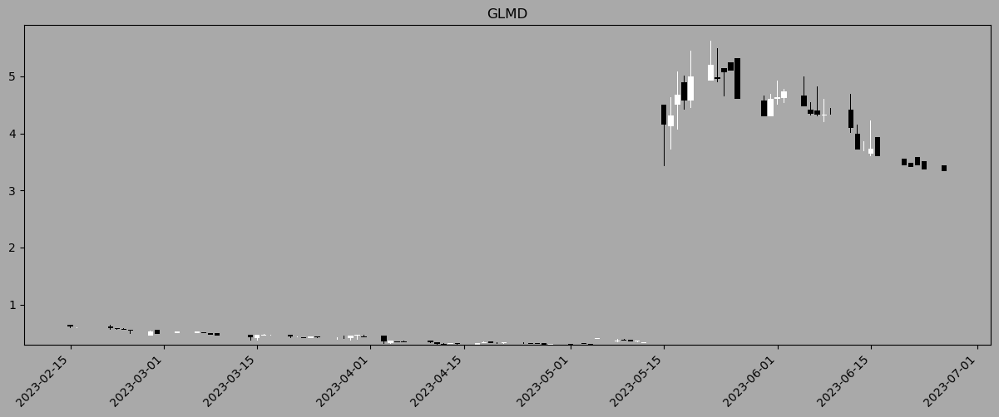

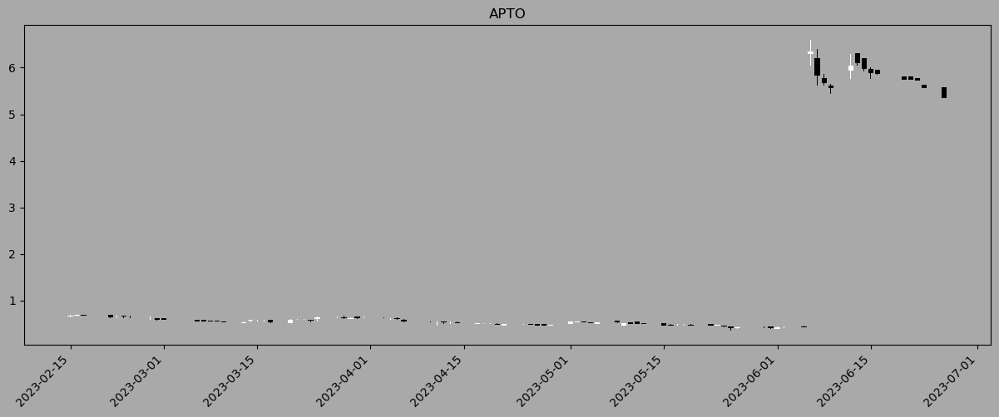

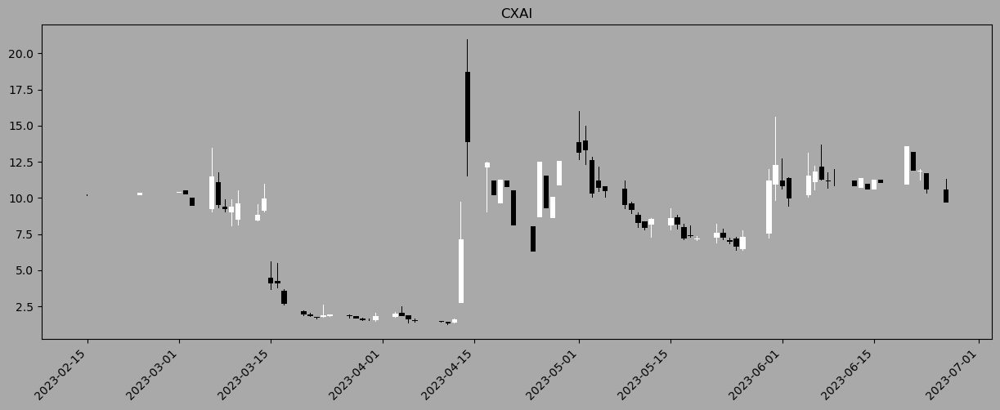

...

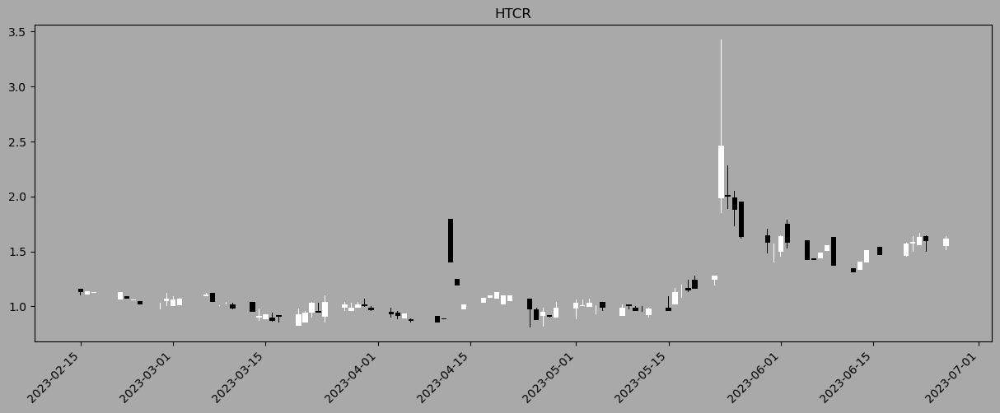

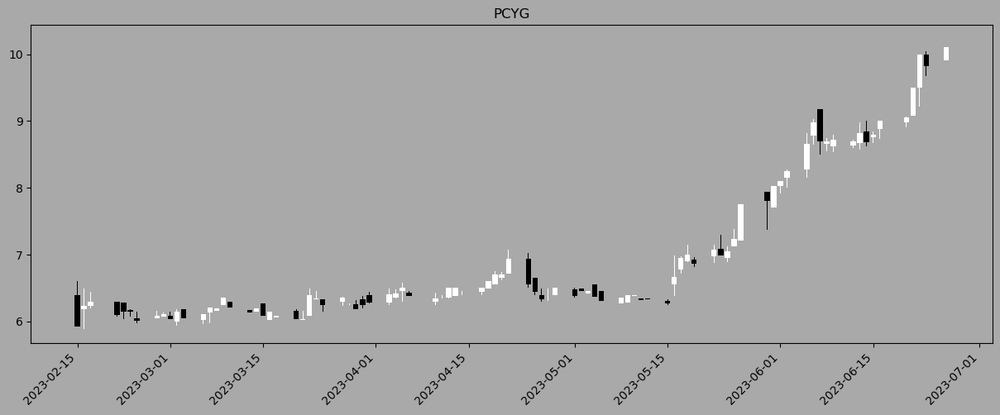

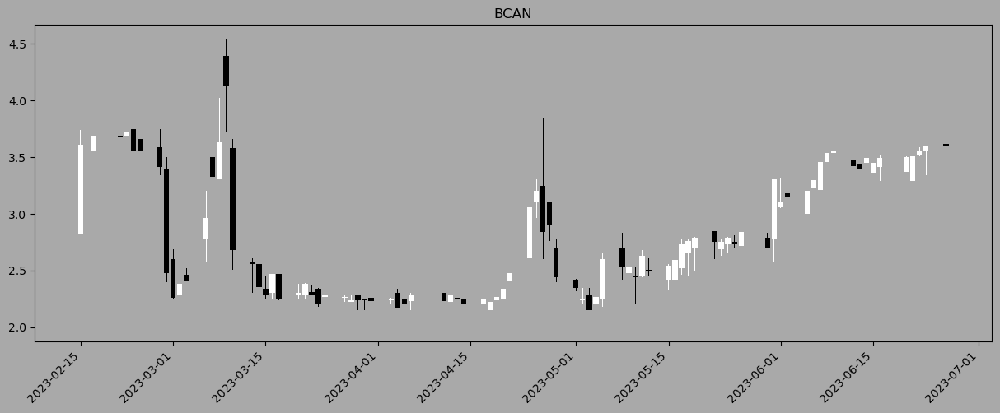

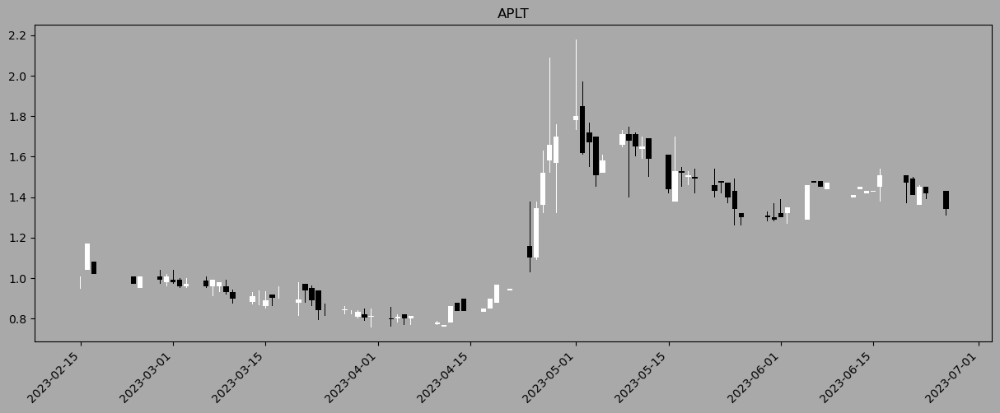

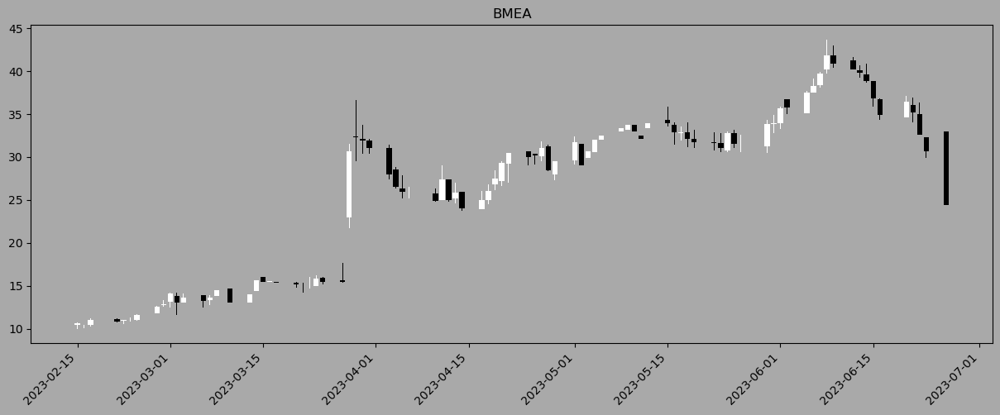

In [7]:
for stock in top_quart_list:
    plot_candles(get_stock(stock), stock)